In [1]:
import sys
sys.path.append("../")

In [60]:
import scipy
import scipy.spatial
from post_processing.src import hdf5_tools
from post_processing.src import plotting
from post_processing.src import filter_joints
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D # <--- This is important for 3d plotting 
import numpy as np
import multiprocessing
from platform import python_version
import h5py
import pathlib
import pandas as pd
import scipy.signal

from post_processing.src import hdf5_tools
from post_processing.src import arm_length


%matplotlib inline 

In [3]:
target_dir=pathlib.Path("/media/mjsobrep/43CDA61E672B9161/pose/")
hdf5_file = h5py.File(target_dir/"smoothed_data.hdf5",'r')
train=pd.read_csv(target_dir/"train.csv")

In [4]:
train

,Unnamed: 0,Unnamed: 0.1,record_id,age,bbt.z_left,bbt.z_right,min_bbt
0,9,10,23,4,-1.034091,-2.561644,-2.561644
1,25,26,44,7,-3.071429,-10.169811,-10.169811
2,3,4,15,5,0.396552,0.507463,0.396552
3,27,28,46,18,-3.764706,-3.712766,-3.764706
4,28,29,48,15,-9.443038,-5.241379,-9.443038
5,35,36,61,14,-4.355263,-2.400000,-4.355263
6,36,37,63,14,-5.139241,-4.781609,-5.139241
7,23,24,42,19,-1.647059,-2.436170,-2.436170
8,24,25,43,14,-3.367089,-2.942529,-3.367089
9,37,38,64,13,-2.365854,-2.481928,-2.481928


In [5]:
hdf5_tools.print_members(hdf5_file)    

003
003/simon_says
003/simon_says/0
003/simon_says/0/time
004
004/simon_says
004/simon_says/0
004/simon_says/0/covariance
004/simon_says/0/covariance/LElbow
004/simon_says/0/covariance/LShoulder
004/simon_says/0/covariance/LWrist
004/simon_says/0/covariance/RElbow
004/simon_says/0/covariance/RShoulder
004/simon_says/0/covariance/RWrist
004/simon_says/0/filtered
004/simon_says/0/filtered/LElbow
004/simon_says/0/filtered/LShoulder
004/simon_says/0/filtered/LWrist
004/simon_says/0/filtered/RElbow
004/simon_says/0/filtered/RShoulder
004/simon_says/0/filtered/RWrist
004/simon_says/0/raw
004/simon_says/0/raw/LElbow
004/simon_says/0/raw/LShoulder
004/simon_says/0/raw/LWrist
004/simon_says/0/raw/RElbow
004/simon_says/0/raw/RShoulder
004/simon_says/0/raw/RWrist
004/simon_says/0/smooth
004/simon_says/0/smooth/LElbow
004/simon_says/0/smooth/LShoulder
004/simon_says/0/smooth/LWrist
004/simon_says/0/smooth/RElbow
004/simon_says/0/smooth/RShoulder
004/simon_says/0/smooth/RWrist
004/simon_says/0/time

031/target_touch/1/filtered/right
031/target_touch/1/raw
031/target_touch/1/raw/left
031/target_touch/1/raw/right
031/target_touch/1/smooth
031/target_touch/1/smooth/left
031/target_touch/1/smooth/right
031/target_touch/1/time
032
032/simon_says
032/simon_says/0
032/simon_says/0/covariance
032/simon_says/0/covariance/LElbow
032/simon_says/0/covariance/LShoulder
032/simon_says/0/covariance/LWrist
032/simon_says/0/covariance/RElbow
032/simon_says/0/covariance/RShoulder
032/simon_says/0/covariance/RWrist
032/simon_says/0/filtered
032/simon_says/0/filtered/LElbow
032/simon_says/0/filtered/LShoulder
032/simon_says/0/filtered/LWrist
032/simon_says/0/filtered/RElbow
032/simon_says/0/filtered/RShoulder
032/simon_says/0/filtered/RWrist
032/simon_says/0/raw
032/simon_says/0/raw/LElbow
032/simon_says/0/raw/LShoulder
032/simon_says/0/raw/LWrist
032/simon_says/0/raw/RElbow
032/simon_says/0/raw/RShoulder
032/simon_says/0/raw/RWrist
032/simon_says/0/smooth
032/simon_says/0/smooth/LElbow
032/simon_say

048/simon_says/0/smooth/RShoulder
048/simon_says/0/smooth/RWrist
048/simon_says/0/time
048/simon_says/1
048/simon_says/1/covariance
048/simon_says/1/covariance/LElbow
048/simon_says/1/covariance/LShoulder
048/simon_says/1/covariance/LWrist
048/simon_says/1/covariance/RElbow
048/simon_says/1/covariance/RShoulder
048/simon_says/1/covariance/RWrist
048/simon_says/1/filtered
048/simon_says/1/filtered/LElbow
048/simon_says/1/filtered/LShoulder
048/simon_says/1/filtered/LWrist
048/simon_says/1/filtered/RElbow
048/simon_says/1/filtered/RShoulder
048/simon_says/1/filtered/RWrist
048/simon_says/1/raw
048/simon_says/1/raw/LElbow
048/simon_says/1/raw/LShoulder
048/simon_says/1/raw/LWrist
048/simon_says/1/raw/RElbow
048/simon_says/1/raw/RShoulder
048/simon_says/1/raw/RWrist
048/simon_says/1/smooth
048/simon_says/1/smooth/LElbow
048/simon_says/1/smooth/LShoulder
048/simon_says/1/smooth/LWrist
048/simon_says/1/smooth/RElbow
048/simon_says/1/smooth/RShoulder
048/simon_says/1/smooth/RWrist
048/simon_s

In [6]:
# cov=hdf5_file['023']['target_touch']['0']['covariance'][joint][:,:3,:3]
# var=np.diagonal(cov,axis1=1,axis2=2)
# med=np.median(var,axis=0)
# mad=np.median(np.abs(var-med), axis=0)
# np.sum(np.any((var-med)>(mad*10),axis=1))

In [7]:
# arm_length.filter_by_variance(cov, 10000).sum()

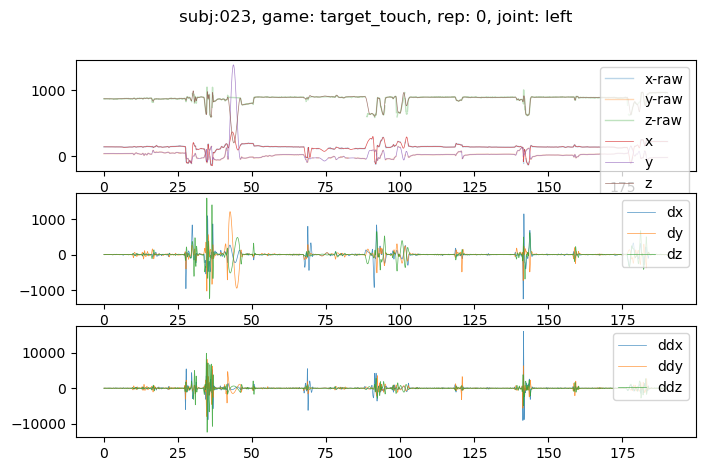

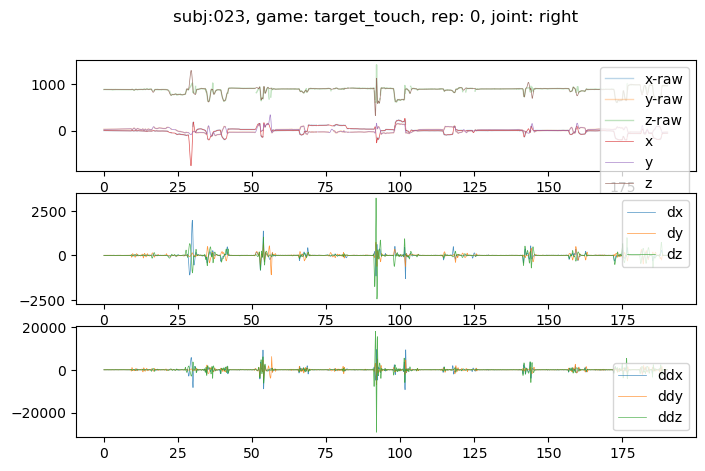

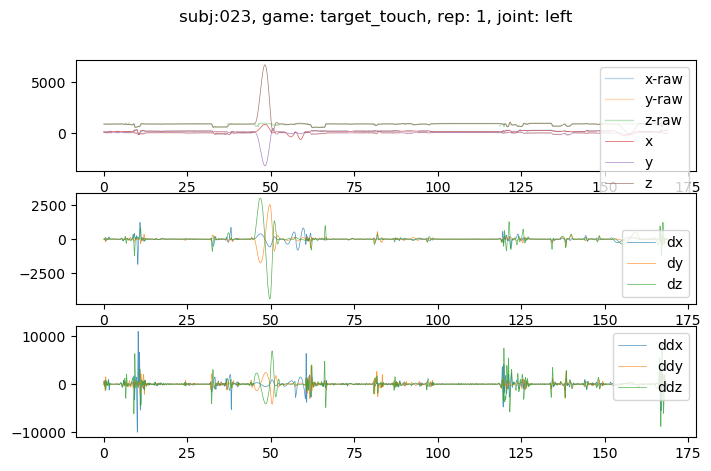

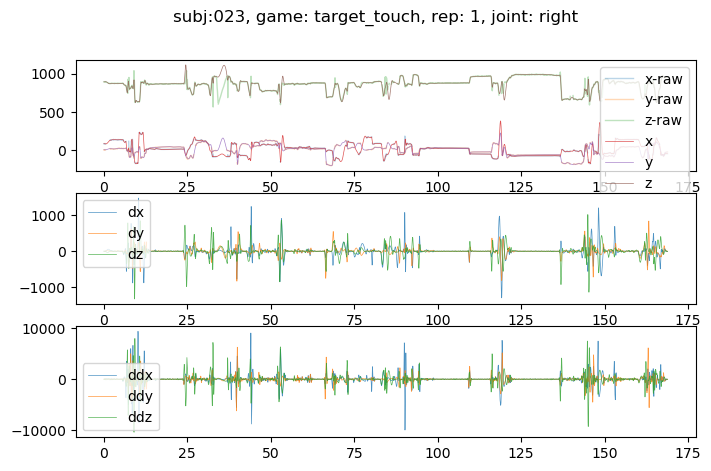

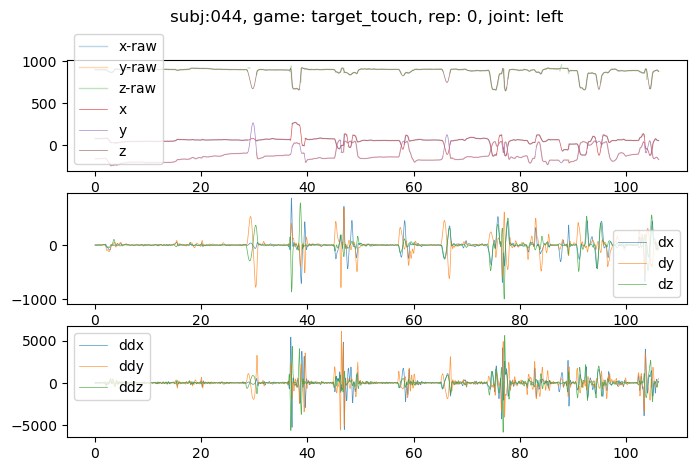

...

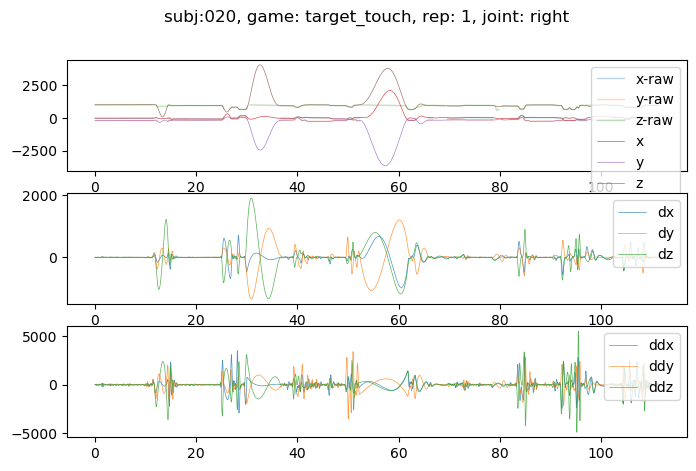

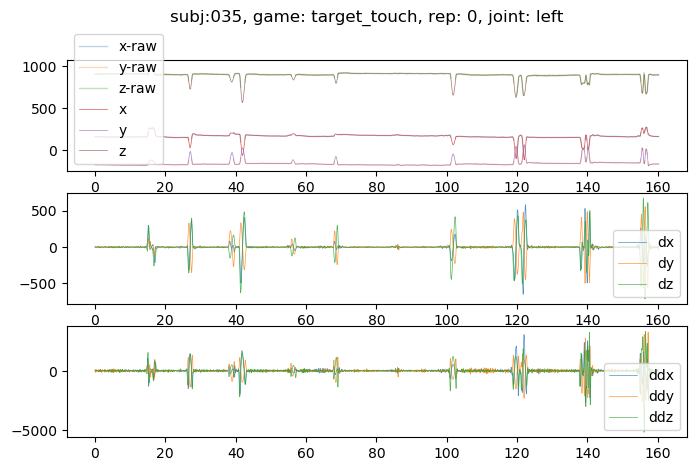

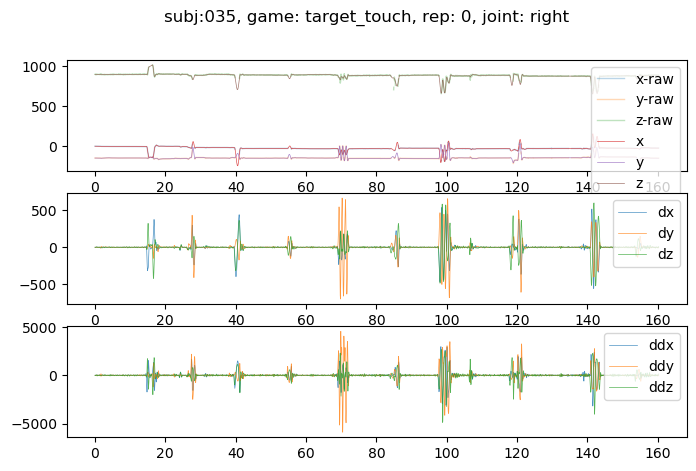

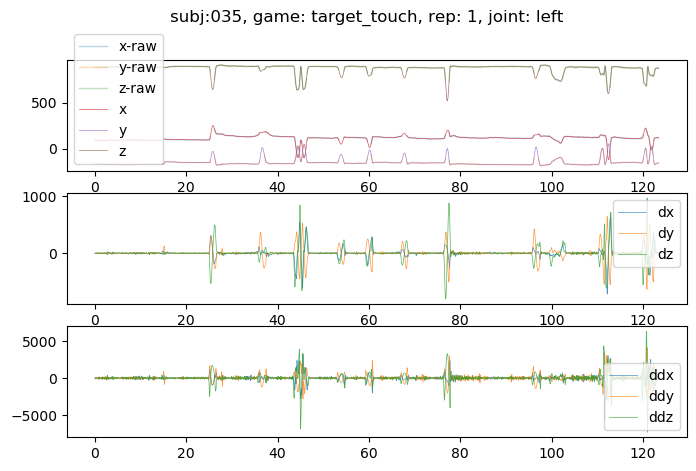

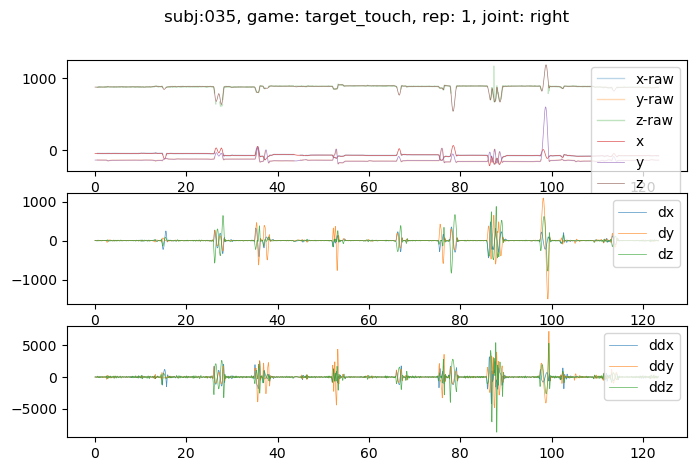

In [8]:
threshold=5
for subj in [f'0{id}' for id in train['record_id']]:
    for game_name in hdf5_file[subj]:
        if not game_name=='target_touch':
            continue
        games=hdf5_file[subj][game_name]
        for rep in games:
            game_rep=games[rep]
            if 'smooth' in game_rep:
                for joint in game_rep['smooth']:
                    # we only really want to filter by position variance
                    low_conf_values=arm_length.filter_by_variance(game_rep['covariance'][joint][:,:3,:3],threshold=20000)
                    masked_data=np.ma.array(game_rep['smooth'][joint])
#                     masked_data[low_conf_values]=np.ma.masked
                    plotting.plot_model_results(game_rep['time'], game_rep['raw'][joint], masked_data, title=f'subj:{subj}, game: {game_name}, rep: {rep}, joint: {joint}')
                    plt.show()

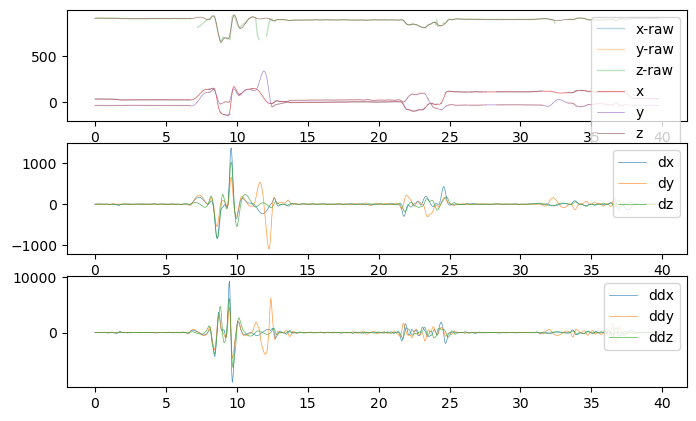

In [20]:
plotting.plot_model_results(hdf5_file['023']['target_touch']['0']['time'], hdf5_file['023']['target_touch']['0']['raw']['right'], hdf5_file['023']['target_touch']['0']['smooth']['right'],1090,1000)

In [101]:
game_rep=hdf5_file['023']['target_touch']['0']
data = game_rep['smooth'][joint]
raw_data=game_rep['raw'][joint]
time=game_rep['time']

velocity = np.sqrt(
    np.sum(np.power(data[:, 3:6], 2), axis=1))
acceleration = np.sqrt(
    np.sum(np.power(data[:, 6:9], 2), axis=1))

edges=np.diff(1*(velocity>100))
start_idx=np.where(edges==1)[0]
end_idx=np.where(edges==-1)[0]
if start_idx[0]>end_idx[0]:
    start_idx=np.insert(start_idx,0,0)
if len(start_idx)>len(end_idx):
    end_idx=np.append(end_idx,len(data)-1)

start_idx_2=[]
end_idx_2=[]
for start, end in zip(start_idx, end_idx):
    local_minima=start+scipy.signal.argrelextrema(velocity[start:end], np.less)[0]
    local_minima=np.insert(local_minima,0,start)
    local_minima=np.append(local_minima,end)
    for idx in range(len(local_minima)-1):
        start_idx_2.append(local_minima[idx])
        end_idx_2.append(local_minima[idx+1])
start_idx=np.array(start_idx_2)
end_idx=np.array(end_idx_2)

real_movements=[
    np.trapz(velocity[start:end], x=time[start:end])>200 for start, end in zip(start_idx, end_idx)]
start_idx=start_idx[real_movements]
end_idx=end_idx[real_movements]

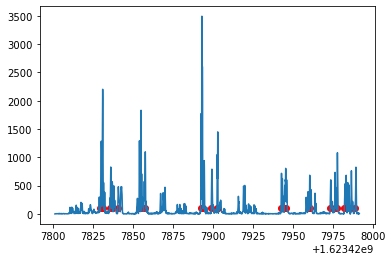

In [102]:
plt.plot(time[:],velocity)
plt.scatter(time[start_idx],np.ones(len(start_idx))*100,c='r')

In [103]:
len(start_idx)

33

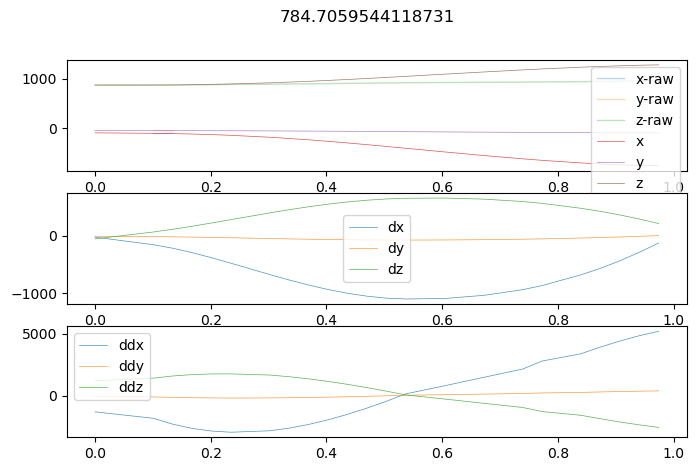

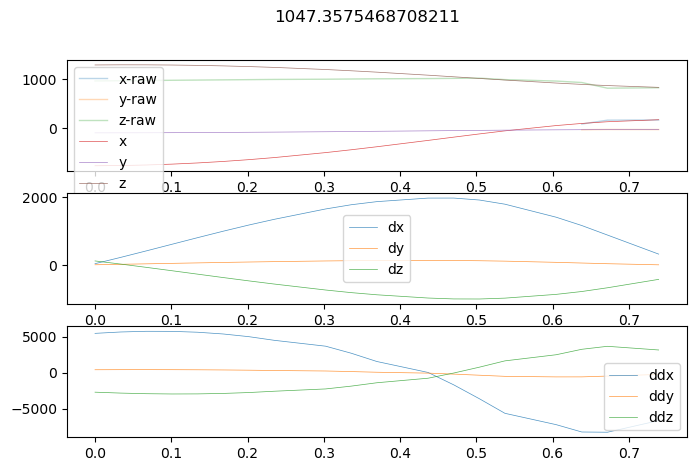

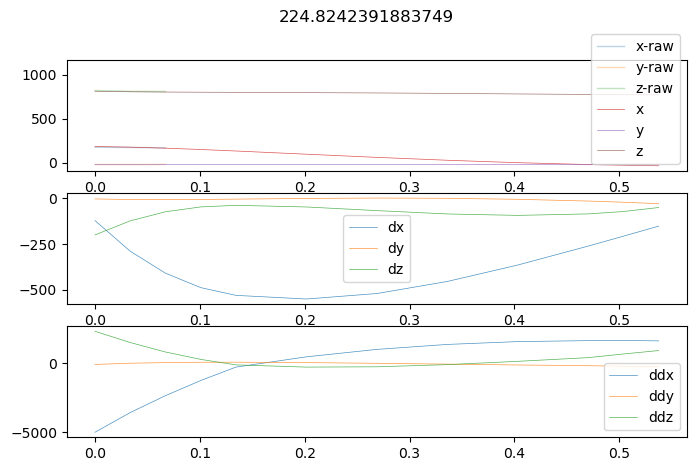

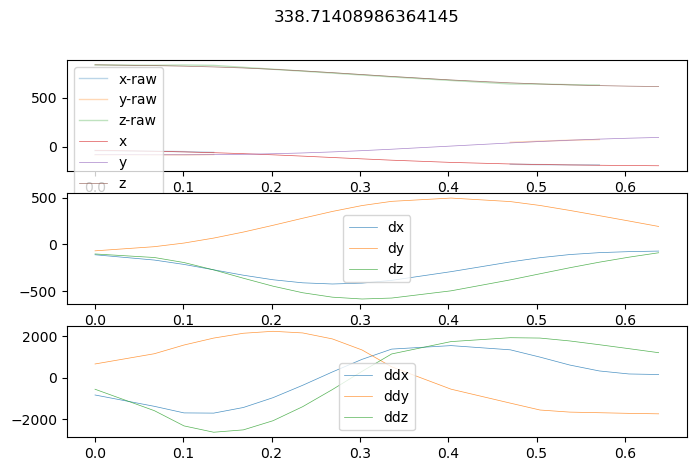

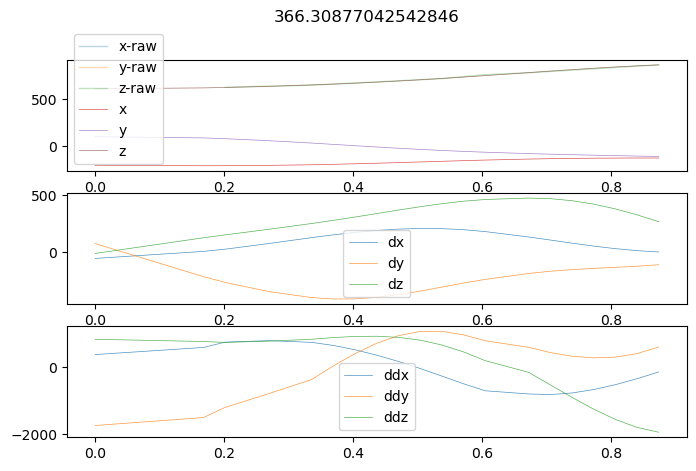

...

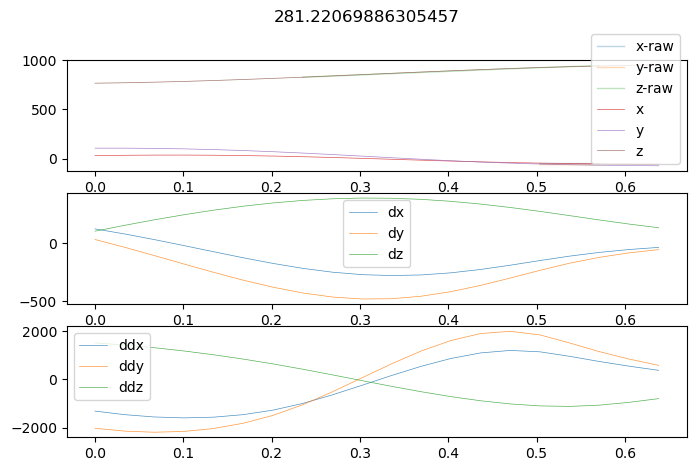

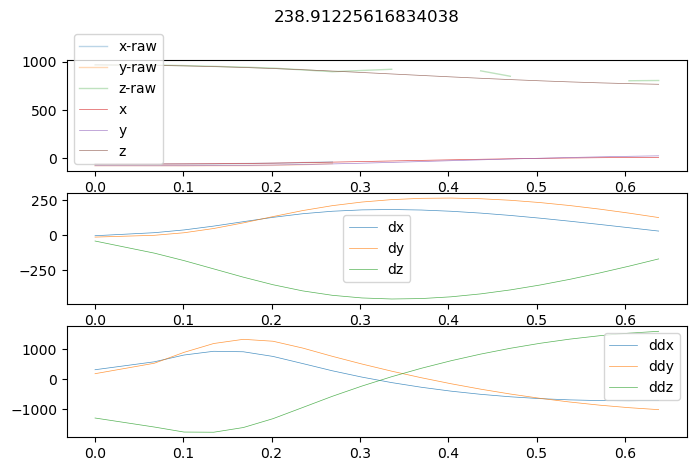

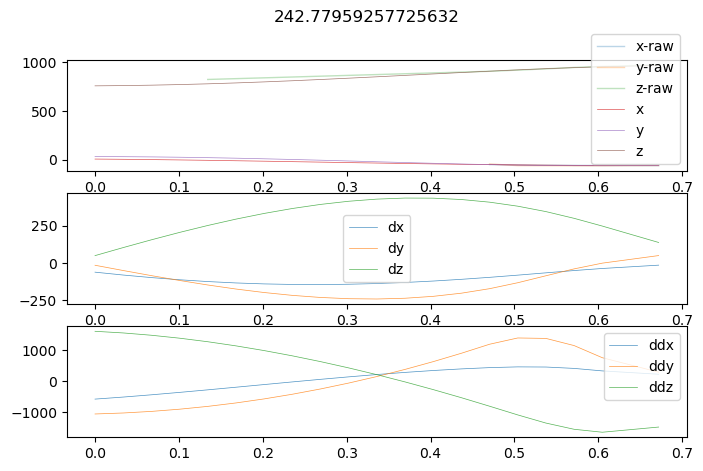

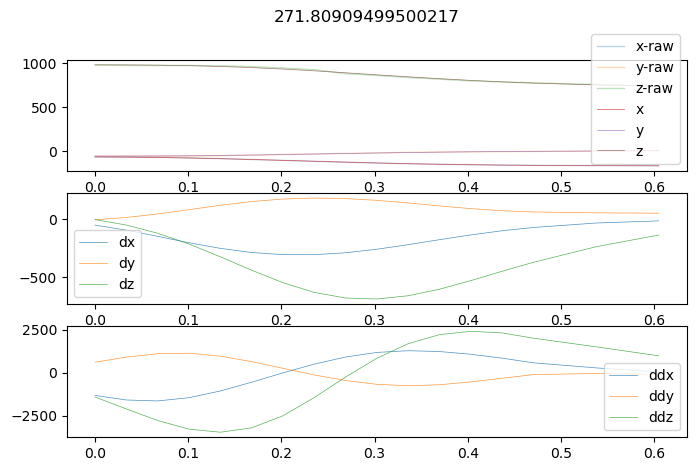

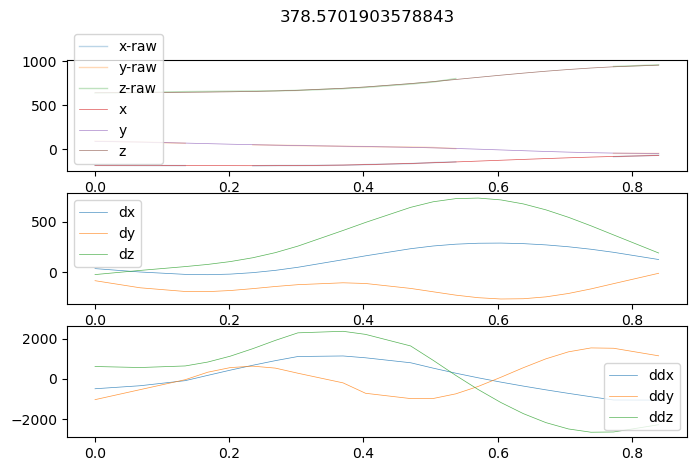

In [104]:
for start, end in zip(start_idx, end_idx):
    plotting.plot_model_results(time, raw_data, data,start,end-start,title=str(np.trapz(velocity[start:end], x=time[start:end])))
    plt.show()